# Installing and loading packages

>First step will be to install and load some packages that we will be using for the manipulation of our data. It includes pandas, numpy and math for data cleaning and manipulation and we will be using **mplsoccer** to finally plot our pitches and the data. mplsoccer has tons of helpful functions that open up a world of data visualisation for you.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mplsoccer import Pitch, VerticalPitch, add_image, FontManager
from matplotlib.colors import LinearSegmentedColormap
import math
import ipywidgets as widgets
from highlight_text import  ax_text, fig_text
import matplotlib.patches as patches
import warnings
from pandas.core.common import SettingWithCopyWarning
from IPython.display import display, Math, Latex


warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

# Loading and cleaning the data

This step is arguably the most important step when working with anyform of data. In here we will be looking at what we have and then cleaning it so as to make it serve our purpose with ease. Here you will see how to create new columns in an existing dataframe, draw some meaningful insights using groupby function etc.

We will first load up and look at our data.
df.head(n) allows you to view the first n rows of your dataframe.

In [2]:
df = pd.read_csv(r"WSL_20-21_Pass_and_Carry_tutorial.csv", low_memory=False)
df.head()

,id,index,period,timestamp,minute,second,possession,duration,related_events,location,...,DefendersInCone,InCone.GK,DefArea,distance.ToD1.360,distance.ToD2.360,milliseconds,ElapsedTime,StartOfPossession,TimeInPoss,TimeToPossEnd
0,3f5dde74-d91b-44ea-9a1f-88e84da555ab,1,1,00:00:00.000,0,0,1,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0.000,0.000,0.0,0.000
1,e4fefe61-4e08-47e0-be4d-2276388e6eb4,2,1,00:00:00.000,0,0,1,0.000000,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0.000,0.000,0.0,0.000
2,ff9a99d3-3efd-45c2-8736-a8a93dd02638,3,1,00:00:00.000,0,0,1,0.000000,5fb7026c-83aa-4490-96b1-a55825c4dcb8,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0.000,0.000,0.0,0.000
3,5fb7026c-83aa-4490-96b1-a55825c4dcb8,4,1,00:00:00.000,0,0,1,0.000000,ff9a99d3-3efd-45c2-8736-a8a93dd02638,NaN,...,NaN,NaN,NaN,NaN,NaN,0,0.000,0.000,0.0,0.000
4,8a29c8bc-df2e-4467-8ca3-2ea98574581c,5,1,00:00:00.218,0,0,2,1.167717,4fdedcf7-587a-48cb-a46e-bc4804317114,"c(61, 40.1)",...,NaN,NaN,NaN,NaN,NaN,218,0.218,0.218,0.0,14.383



The distances have been calculated using Euclidean Distance Formula $\sqrt {\left( {x_1 - x_2 } \right)^2 + \left( {y_1 - y_2 } \right)^2}$ where (x1,y1) are the coordinates of the starting location and (x2, y2) are the coordinates of the end location.

Statsbomb provides the end location of carries in a separate column so we can calculate the distance of end points of passes and carries separately.

In [3]:
df['initialDistancefromgoal'] = np.sqrt(((120 - df['location.x'])**2) + ((40 - df['location.y'])**2))
df['finalDistancefromgoal'] = np.sqrt(((120 - df['pass.end_location.x'])**2) + ((40 - df['pass.end_location.y'])**2))


df['finalDistancefromgoalcarry'] = np.sqrt(((120 - df['carry.end_location.x'])**2) + ((40 - df['carry.end_location.y'])**2))

In [4]:
df['deepCompletion'] = np.where(((df['finalDistancefromgoal'] <= (21.87)) & (df['initialDistancefromgoal'] >= (21.87)) | ((df['finalDistancefromgoalcarry'] <= (21.87)) & (df['initialDistancefromgoal'] >= (21.87)))), 'True', 'False')

df.head()

,id,index,period,timestamp,minute,second,possession,duration,related_events,location,...,distance.ToD2.360,milliseconds,ElapsedTime,StartOfPossession,TimeInPoss,TimeToPossEnd,initialDistancefromgoal,finalDistancefromgoal,finalDistancefromgoalcarry,deepCompletion
0,3f5dde74-d91b-44ea-9a1f-88e84da555ab,1,1,00:00:00.000,0,0,1,0.000000,NaN,NaN,...,NaN,0,0.000,0.000,0.0,0.000,NaN,NaN,NaN,False
1,e4fefe61-4e08-47e0-be4d-2276388e6eb4,2,1,00:00:00.000,0,0,1,0.000000,NaN,NaN,...,NaN,0,0.000,0.000,0.0,0.000,NaN,NaN,NaN,False
2,ff9a99d3-3efd-45c2-8736-a8a93dd02638,3,1,00:00:00.000,0,0,1,0.000000,5fb7026c-83aa-4490-96b1-a55825c4dcb8,NaN,...,NaN,0,0.000,0.000,0.0,0.000,NaN,NaN,NaN,False
3,5fb7026c-83aa-4490-96b1-a55825c4dcb8,4,1,00:00:00.000,0,0,1,0.000000,ff9a99d3-3efd-45c2-8736-a8a93dd02638,NaN,...,NaN,0,0.000,0.000,0.0,0.000,NaN,NaN,NaN,False
4,8a29c8bc-df2e-4467-8ca3-2ea98574581c,5,1,00:00:00.218,0,0,2,1.167717,4fdedcf7-587a-48cb-a46e-bc4804317114,"c(61, 40.1)",...,NaN,218,0.218,0.218,0.0,14.383,59.000085,81.797861,NaN,False


## Groupby and some more filtering

The next step would be to eliminate the entries from corner situation because this would skew the data in favor of the corner takers. We will also only consider successful passes.

Following this we get to groupby, which is a key function that allows us to aggregate our data and look at the leaderboards in various categories.

In [5]:
deepcompletion = df.loc[(df['play_pattern.name']!='From Corner') & (((df['deepCompletion']=='True') & (df['pass.outcome.name']!='Incomplete')))]

dc_list = deepcompletion.groupby(['player.name','team.name']).size().reset_index().rename(columns={0:'count'}).sort_values('count', ascending = False).reset_index()
del dc_list['index']
dc_list.head(10)

,player.name,team.name,count
0,Chloe Kelly,Manchester City WFC,105
1,Vivianne Miedema,Arsenal WFC,90
2,Francesca Kirby,Chelsea FCW,76
3,Ebony Salmon,Bristol City WFC,69
4,Katie McCabe,Arsenal WFC,68
5,Bethany Mead,Arsenal WFC,68
6,Samantha May Kerr,Chelsea FCW,60
7,Pernille Mosegaard Harder,Chelsea FCW,58
8,Lauren Hemp,Manchester City WFC,53
9,Nicoline Sørensen,Everton LFC,48


We can play around and select players from out dataframe by creating a dropdown list of all the names in our dataframe. This can come in handy when creating an interactive dashboard.

In [7]:
options = df["player.name"].unique()
options = options.tolist()

options = [x for x in options if str(x) != 'nan']
playerlist = widgets.Combobox(
    placeholder='Enter a name',
    options=options,
    description='Player:',
    ensure_option=True,
    disabled=False
)
playerlist

Combobox(value='', description='Player:', ensure_option=True, options=('Angela Addison', 'Kerys Harrop', 'Kit …

In [8]:
player = playerlist.value

# Plotting the data

We can now get to the real nice stuff i.e. plotting our data onto the pitch. This is where mplsoccer makes our life so much easier because you don't have to create your own pitches (something that you can do and probably should try it once just as an excercise and to understand some more functions). mplsoccer also provides us with enough customizations on top of matplotlib that should be more than sufficient to get you started

In [9]:
#I like to keep my color palette and some constants in one place so I can change things here and then it's applied
#everywhere.

pitchColor = "white"
lineColor = "#070707"
passColor = "#636669"
faceColor = pitchColor
passColor = '#3371AC'
carryColor = '#DC2228'

radius = 21.87 #radius of the penalty box to draw the arc

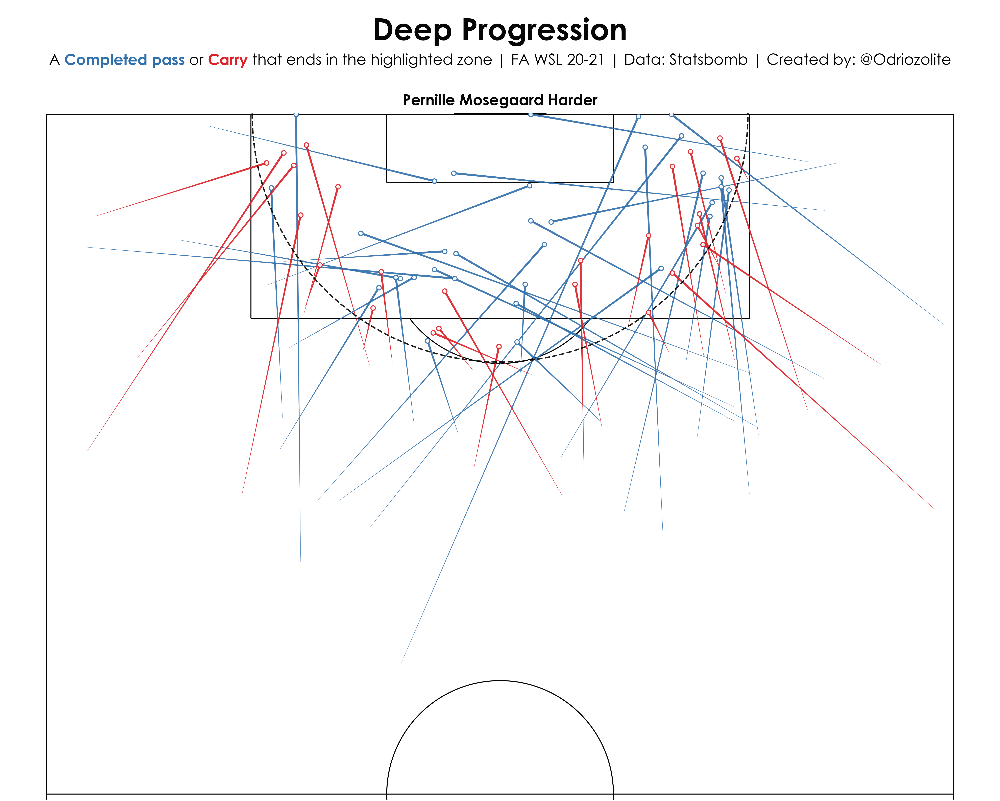

In [10]:
#Plotting the pitch

pitch = VerticalPitch(pitch_type='statsbomb', figsize = (16,14),pad_top=0.1, pad_bottom=0.5,
                  pitch_color=pitchColor, line_color=lineColor,half = True,
                  constrained_layout=True, tight_layout=True, line_zorder=1, linewidth=5, spot_scale=0.00)

fig, ax = pitch.grid(nrows=1, ncols=1, figheight=55,
                      endnote_height=0.0, endnote_space=0, axis=False,
                      title_height=0.13, grid_height=0.86, space=0.11)

fig.set_facecolor(pitchColor)

#Title of our plot

fig.suptitle("Deep Progression", fontsize=150, color='#070707',
            fontfamily = "Century Gothic", fontweight = "bold",y=0.98)


highlight_textprops =\
    [{"color": "#3371AC","fontweight": 'bold'},
     {"color": "#DC2228","fontweight": 'bold'}
    ]

Title = fig_text(s = "A <Completed pass> or <Carry> that ends in the highlighted zone | FA WSL 20-21 | Data: Statsbomb | Created by: @Odriozolite",
        x = 0.5, y = 0.935, highlight_textprops = highlight_textprops ,
        fontfamily = "Century Gothic",fontweight='regular', ha='center',fontsize=75);


#The plotting of the area of focus for our plot. This is one of the aesthetic element that if you don't like you can ignore.
#We will be drawing a semicircle centered at the mid-point of the goal with a diameter equal to the width of the penalty box.
#The important stylistic arguments here are linestyle, I have gone with a dashed line instead of a solid one, more on this
#can be found out in Matplotlib docs which I highly recommend you check out.

#Zorder is basically layering different elements of our viz on top of one another, so we want our semi-circle to be plotted
#as the third layer from the bottom. 

circle = patches.Circle([40,120],radius = radius , linewidth = 7, linestyle='--',
                  edgecolor='#070707', facecolor='none', alpha=0.9, zorder=3 )
ax['pitch'].add_patch(circle)


#Defining out plotting function

def plot_DC(df, player):
    df = df[(df['player.name'] == player)]
    
    
    ax['pitch'].set_title(str(player) , fontsize=75, color=lineColor,
                  fontfamily = "Century Gothic", fontweight = 'bold', va="center", ha="center", pad=60)
    
    #Plotting the passes. The scatter point at the end of the the lines is a stylistic choice and you can do it without it.
    #The syntax is very intuitive and you can control various parameters of the lines by controlling different arguments.
    
    pitch.lines(df['location.x'], df['location.y'], df['pass.end_location.x'], df['pass.end_location.y'], 
                ax=ax['pitch'],comet = True, color= passColor, lw=10, alpha = 0.7)
    pitch.scatter(df['pass.end_location.x'], df['pass.end_location.y'], edgecolors= passColor, c=pitchColor,
          s = 500, zorder=4, ax=ax['pitch'], marker = 'o', alpha = 0.9,linewidths=5)
    
    #plotting the carries

    pitch.lines(df['location.x'], df['location.y'], df['carry.end_location.x'], df['carry.end_location.y'],
                ax=ax['pitch'],comet = True, color= carryColor, lw=10, alpha = 0.7)
    pitch.scatter(df['carry.end_location.x'], df['carry.end_location.y'], edgecolors= carryColor, c=pitchColor,
          s = 500, zorder=5, ax=ax['pitch'], marker = 'o', alpha = 0.9,linewidths=5)
    
plot_DC(df = deepcompletion, player=player) 

## Plotting on a 1 by 2 grid using functions

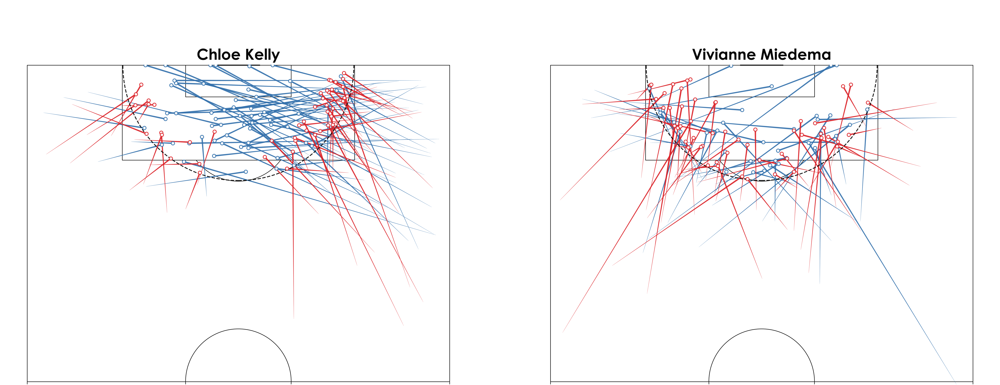

In [11]:
pitch = VerticalPitch(pitch_type='statsbomb', figsize = (16,14),pad_top=0.1, pad_bottom=0.5,pad_left=5,pad_right=5,
                  pitch_color=pitchColor, line_color=lineColor,half = True,
                  constrained_layout=True, tight_layout=True, line_zorder=1, linewidth=5, spot_scale=0.00)

fig, ax = pitch.grid(nrows=1, ncols=2, figheight=55,
                      endnote_height=0.0, endnote_space=0,axis=False,
                      title_height=0.15, grid_height=0.80, space=0.15)

fig.set_facecolor(pitchColor)


#Adding the circular patches but notice how we have to create two instances for the patch. You can try and remove it, to better
#understand why that's the case.

circle = patches.Circle([40,120],radius = radius , linewidth = 9, linestyle='--',
                  edgecolor='#070707', facecolor='none', alpha=0.9, zorder=2 )
circle1 = patches.Circle([40,120],radius = radius , linewidth = 9, linestyle='--',
                  edgecolor='#070707', facecolor='none', alpha=0.9, zorder=2)
ax['pitch'][0].add_patch(circle)
ax['pitch'][1].add_patch(circle1)


#Cycling through our list of leaderboards for deep completions and using numbers to select which pitch we want to plot it on.
#numbering starts from 0 from the left hand side.

def plot_DC(df,x, n):
    df = df[(df['player.name'] == dc_list['player.name'].iloc[n])]
    
    
    ax['pitch'][x].set_title(str(dc_list['player.name'].iloc[n]) , fontsize=150, color=lineColor,
                  fontfamily = "Century Gothic", fontweight = 'bold', va="center", ha="center", pad=90)
    
    pitch.lines(df['location.x'], df['location.y'], df['pass.end_location.x'], df['pass.end_location.y'], 
                ax=ax['pitch'][x],comet = True, color= passColor, lw=14, alpha = 0.7)
    pitch.scatter(df['pass.end_location.x'], df['pass.end_location.y'], edgecolors= passColor, c=pitchColor,
          s = 1100, zorder=4, ax=ax['pitch'][x], marker = 'o', alpha = 0.9,linewidths=7.5)

    pitch.lines(df['location.x'], df['location.y'], df['carry.end_location.x'], df['carry.end_location.y'],
                ax=ax['pitch'][x],comet = True, color= carryColor, lw=14, alpha = 0.7)
    pitch.scatter(df['carry.end_location.x'], df['carry.end_location.y'], edgecolors= carryColor, c=pitchColor,
          s = 1100, zorder=5, ax=ax['pitch'][x], marker = 'o', alpha = 0.9,linewidths=7.5)

#plotting using function
    
plot_DC(df = deepcompletion,x=0, n=0)
plot_DC(df = deepcompletion,x=1, n=1)


# OOP(s) I did it again!

>One problem that you might have seen in the example above is to create a new instance of our circle patch to plot it on different subplots. While we only had 2 subplots there it wasn't a major issue but if you plan to have more subplots then creating a new instance every time can be cumbersome.

>A solution to this is creating a class to avoid the issue of not being able to create different instances of the same artist. You can just make a reference to the patch function of this class and you get a new instance every time but with the same parameters!

In [12]:
class artist_instance:
    def __init__(self,
                 xy=None,
                 radius = None,
                 linewidth=None,
                 linestyle=None,
                 facecolor = None,
                 edgecolor = None,
                 type=None,
                 ):
        self.xy=xy if xy is not None else (1,1)
        self.radius=radius if radius is not None else 21.2
        self.linewidth=linewidth if linewidth is not None else 7
        self.linestyle=linestyle if linestyle is not None else '-'
        self.facecolor=facecolor if facecolor is not None else 'blue'
        self.edgecolor=edgecolor if edgecolor is not None else 'blue'
        self.type=type if type is not None else 'Circle'

    def patch(self):
        return getattr(patches,self.type)(xy=self.xy,radius=self.radius,linewidth=self.linewidth,
                                          facecolor=self.facecolor,edgecolor=self.edgecolor,linestyle=self.linestyle)

Circle=artist_instance(xy=(40,120), radius =21.87, type='Circle', linewidth = 7.5,linestyle='--',facecolor='none',
                       edgecolor='#070707')

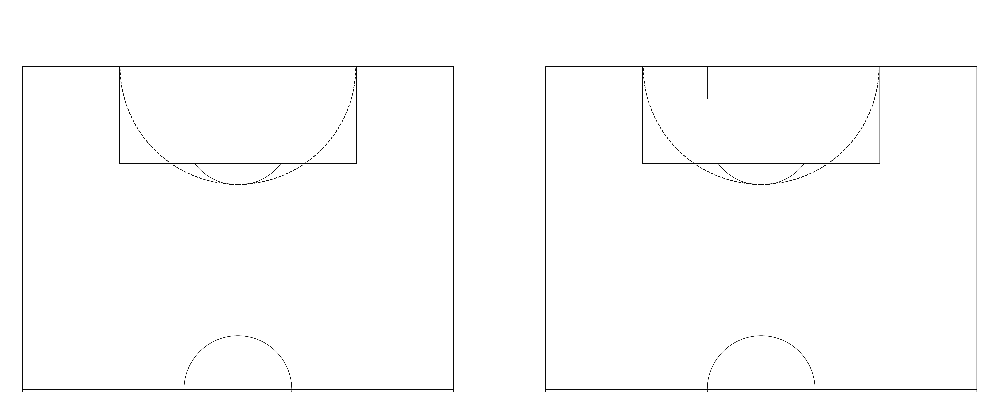

In [13]:
pitch = VerticalPitch(pitch_type='statsbomb', figsize = (16,14),pad_top=0.1, pad_bottom=0.5,
                  pitch_color=pitchColor, line_color=lineColor,half = True,
                  constrained_layout=True, tight_layout=True, line_zorder=1, linewidth=5, spot_scale=0.00)

fig, ax = pitch.grid(nrows=1, ncols=2, figheight=55,
                      endnote_height=0.0, endnote_space=0,axis=False,
                      title_height=0.15, grid_height=0.80, space=0.15)

fig.set_facecolor(pitchColor)


ax['pitch'][0].add_patch(Circle.patch())
ax['pitch'][1].add_patch(Circle.patch())



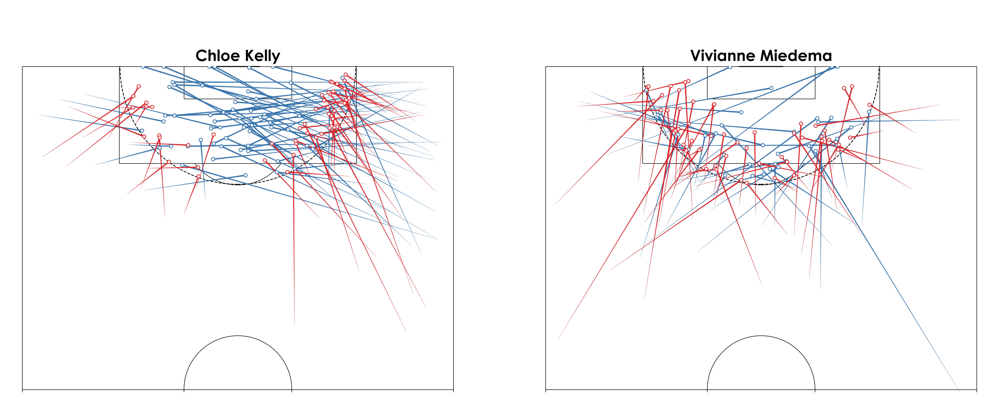

In [14]:
pitch = VerticalPitch(pitch_type='statsbomb', figsize = (16,14),pad_top=0.1, pad_bottom=0.5,
                  pitch_color=pitchColor, line_color=lineColor,half = True,
                  constrained_layout=True, tight_layout=True, line_zorder=1, linewidth=5, spot_scale=0.00)

fig, ax = pitch.grid(nrows=1, ncols=2, figheight=55,
                      endnote_height=0.0, endnote_space=0,axis=False,
                      title_height=0.15, grid_height=0.80, space=0.15)

fig.set_facecolor(pitchColor)


def plot_DC(df,x, n):
    df = df[(df['player.name'] == dc_list['player.name'].iloc[n])]
    
    
    #Adding the patch & setting the title
    ax['pitch'][x].add_patch(Circle.patch())
    
    ax['pitch'][x].set_title(str(dc_list['player.name'].iloc[n]) , fontsize=150, color=lineColor,
                  fontfamily = "Century Gothic", fontweight = 'bold', va="center", ha="center", pad=90)
    
    #Plotting the passes
    
    pitch.lines(df['location.x'], df['location.y'], df['pass.end_location.x'], df['pass.end_location.y'], 
                ax=ax['pitch'][x],comet = True, color= passColor, lw=14, alpha = 0.7)
    pitch.scatter(df['pass.end_location.x'], df['pass.end_location.y'], edgecolors= passColor, c=pitchColor,
          s = 1100, zorder=4, ax=ax['pitch'][x], marker = 'o', alpha = 0.9,linewidths=7.5)
    
    #Plotting the carries

    pitch.lines(df['location.x'], df['location.y'], df['carry.end_location.x'], df['carry.end_location.y'],
                ax=ax['pitch'][x],comet = True, color= carryColor, lw=14, alpha = 0.7)
    pitch.scatter(df['carry.end_location.x'], df['carry.end_location.y'], edgecolors= carryColor, c=pitchColor,
          s = 1100, zorder=5, ax=ax['pitch'][x], marker = 'o', alpha = 0.9,linewidths=7.5)
    
    
    
plot_DC(df = deepcompletion,x=0, n=0)
plot_DC(df = deepcompletion,x=1, n=1)

## Homework

The next step in this procedure would be to try and create a grid of say, 3-by-3 for example, as I did in my viz and populating it using for loops or maybe just functions.